## LIBRARY

In [3]:
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import os
import numpy as np
from PIL import Image
import string

/home/namhoai/WorkingSpace/env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## PARAMETERS


In [4]:
epochs = 50
z_dim = 100
learning_rate = 0.0002
loss_func = nn.BCELoss()

batch_size = 26*4
device = 'cuda'

good_value = 10
class_label = [i for i in range(26)]
num_label = len(class_label)

## SHOW 


In [479]:
def show(gen_noise, batch_size, z_dim, num_label, GEN):
    # Generating images
    noise = gen_noise(batch_size, z_dim)
    A_Z = list(string.ascii_uppercase)
    labels = torch.LongTensor([i for _ in range(batch_size // num_label) for i in range(num_label)]).to(device)
    sample_images = GEN(noise, labels).unsqueeze(1).data.cpu()

    # Show images
    grid = (make_grid(sample_images, nrow=num_label, normalize=True).permute(1, 2, 0).numpy())
    _, ax = plt.subplots(figsize=(20, 20))
    ax.imshow(grid)
    ax.set_xticks(np.arange(num_label) * (grid.shape[1] / num_label)+ (grid.shape[1] / num_label) / 2)
    ax.set_xticklabels(A_Z, rotation=0, ha="center", fontsize=20)
    plt.yticks([])
    plt.show()

## DATA

In [5]:
class CustomDataset(Dataset):
    def __init__(self, path, size=28):
        self.size = size
        self.transform = transforms.Compose(
            [
                transforms.Resize((size, size)),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
            ]
        )
        self.items = []
        self.labels = []

        for filename in os.listdir(path)[:327000]:
            item_path = os.path.join(path, filename)
            self.items.append(item_path)
            if filename[-6] == "_":
                self.labels.append(int(filename[-5]))
            else:
                self.labels.append(int(filename[-6:-4]))

    def __len__(self):
        return len(self.items)

    def __getitem__(self, index):
        item_path = self.items[index]
        label = self.labels[index]

        image = Image.open(item_path).convert("L")
        image = self.transform(image)

        return image, label


data_path = "/home/namhoai/WorkingSpace/All_Data/Data_A_Z"

custom_dataset = CustomDataset(data_path, size=28)

dataloader = DataLoader(custom_dataset, batch_size=batch_size, shuffle=True)

## CONSTRUCT_GANs

In [6]:
def gen_noise(number, z_dim):
    return torch.randn(number, z_dim).to(device)

### GENERATOR

In [7]:
def genBlock(input, output):
  return nn.Sequential(
      nn.Linear(input, output),
      nn.BatchNorm1d(output),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
    def __init__(self, num_label,z_dim=100, image_dim=784, hidden_dim=256):
        super(Generator,self).__init__()
        self.num_label = num_label
        self.z_dim = z_dim
        self.label_embedding = nn.Embedding(num_label, num_label)
        self.model_gen = nn.Sequential(
            genBlock(self.z_dim+self.num_label, hidden_dim),    
            genBlock(hidden_dim, hidden_dim*2),                    
            genBlock(hidden_dim*2, hidden_dim*4),  
            nn.Linear(hidden_dim*4, image_dim),    
            nn.Tanh(),
        )

    def forward(self, noise,label):
        lable_embedding = self.label_embedding(label)
        combine = torch.cat([noise,lable_embedding],1)
        model = self.model_gen(combine)
        return model.view(-1,28,28)

### DISCRIMINATOR

In [8]:
## Discriminator
def disc_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim), nn.LeakyReLU(0.2), nn.Dropout(0.3)
    )

class Discriminator(nn.Module):
    def __init__(self, num_label,image_dim = 28, hidden_dim=256):
        super(Discriminator, self).__init__()
        self.num_label = num_label
        self.image_dim =  image_dim
        self.label_embedding = nn.Embedding(num_label, num_label)
        self.model_disc = nn.Sequential(
            disc_block(image_dim*image_dim+num_label, hidden_dim * 4), 
            disc_block(hidden_dim * 4, hidden_dim * 2),  
            disc_block(hidden_dim * 2, hidden_dim),  
            nn.Linear(hidden_dim, 1),  
            nn.Sigmoid(),
        )

    def forward(self, image,label):
        image = image.view(-1, self.image_dim*self.image_dim)
        lable_embedding = self.label_embedding(label)
        combine = torch.cat([image, lable_embedding], 1)
        model = self.model_disc(combine)
        return model.squeeze()

### MODEL

In [9]:
GEN = Generator(num_label).to(device)
gen_opt = torch.optim.Adam(GEN.parameters(), lr=learning_rate, betas=(0.5, 0.999))
DISC = Discriminator(num_label).to(device)
disc_opt = torch.optim.Adam(DISC.parameters(), lr=learning_rate, betas=(0.5, 0.999))

In [485]:
GEN

Generator(
  (label_embedding): Embedding(26, 26)
  (model_gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=126, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Linear(in_features=1024, out_features=784, bias=True)
    (4): Tanh()
  )
)

In [486]:
DISC

Discriminator(
  (label_embedding): Embedding(26, 26)
  (model_disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=810, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
      (2): Dropout(p=0.3, inplace=False)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
      (2): Dropout(p=0.3, inplace=False)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
      (2): Dropout(p=0.3, inplace=False)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
    (4): Sigmoid()
  )
)

## LOSS

### LOSS_GENERATOR

In [487]:
def calc_gen_loss( gen, disc, number, z_dim,num_label):
    loss = nn.BCELoss()
    
    noise = gen_noise(number, z_dim)
    fake_label = torch.LongTensor(np.random.randint(0,num_label,number)).to(device)
    fake_image = gen(noise,fake_label)

    pred = disc(fake_image,fake_label)
    # 1 = true & 0 = False
    targets = torch.ones_like(pred)
    gen_loss = loss(pred, targets)

    return gen_loss

### LOSS_DISCRIMINATOR

In [488]:
def calc_disc_loss(gen, disc, number, real, z_dim,num_label,real_label):
    loss = nn.BCELoss()
    
    noise = gen_noise(number, z_dim)
    fake_label = torch.LongTensor(np.random.randint(0, num_label, number)).to(device)
    fake_image = gen(noise,fake_label)
    disc_fake = disc(fake_image.detach(), fake_label)

    disc_fake_targets = torch.zeros_like(disc_fake)
    disc_fake_loss = loss(disc_fake, disc_fake_targets).to(device)

    disc_real = disc(real,real_label)
    disc_real_targets = torch.ones_like(disc_real)
    disc_real_loss = loss(disc_real, disc_real_targets).to(device)

    # disc = (real + fake) / 2
    disc_loss = (disc_fake_loss + disc_real_loss) / 2

    return disc_loss

## TRAIN

In [489]:
def train(dataloader,GEN,gen_opt,DISC,disc_opt,num_label,z_dim):
    mean_gen_loss, mean_disc_loss = 0, 0
    for (image, label) in tqdm(dataloader):
        
        # process
        image = image[:,0].to(device)
        cur_bs = len(image)
        image = image.to(device)
        label = label.to(device)  
        real_label = label.clone().detach()

        # discriminator
        disc_opt.zero_grad()

        disc_loss = calc_disc_loss(GEN, DISC, cur_bs, image, z_dim, num_label,real_label)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # generator
        gen_opt.zero_grad()
        gen_loss = calc_gen_loss(GEN, DISC, cur_bs, z_dim,num_label)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()

        ### Loss
        mean_disc_loss += disc_loss.item()/len(dataloader)
        mean_gen_loss += gen_loss.item() / len(dataloader)
    return mean_disc_loss,mean_gen_loss

START TRAINING
EPOCH:  0


100%|██████████| 3145/3145 [04:37<00:00, 11.31it/s]


Discriminator Loss: 0.4355932  Generator Loss: 1.7793421
SAVE MODEL --------------------------------------------------


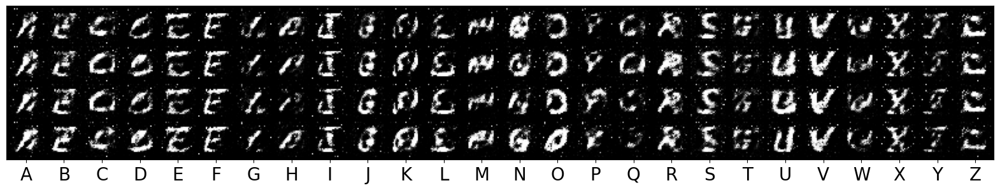

EPOCH:  1


100%|██████████| 3145/3145 [04:54<00:00, 10.67it/s]


Discriminator Loss: 0.4777767  Generator Loss: 1.5125285
SAVE MODEL --------------------------------------------------


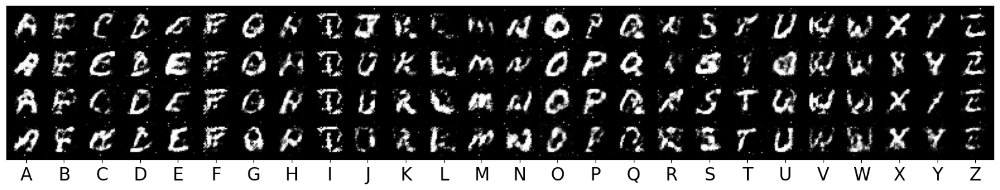

EPOCH:  2


100%|██████████| 3145/3145 [04:58<00:00, 10.54it/s]


Discriminator Loss: 0.5547528  Generator Loss: 1.2345703
SAVE MODEL --------------------------------------------------


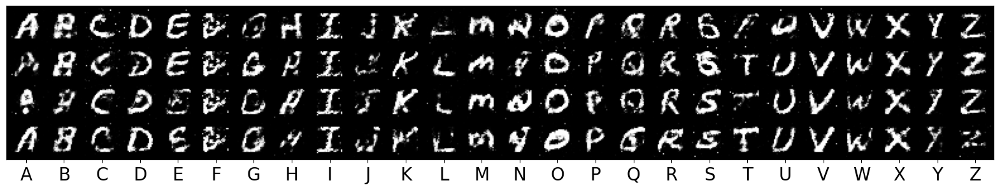

EPOCH:  3


100%|██████████| 3145/3145 [04:41<00:00, 11.18it/s]


Discriminator Loss: 0.5824106  Generator Loss: 1.1283512
SAVE MODEL --------------------------------------------------


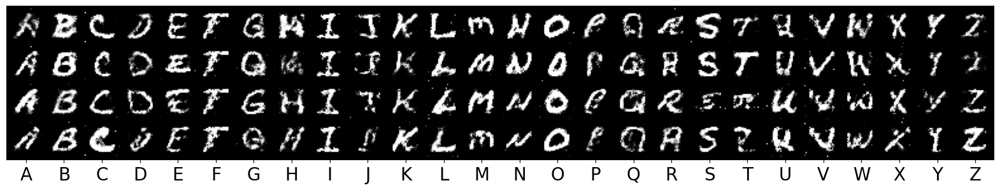

EPOCH:  4


100%|██████████| 3145/3145 [04:52<00:00, 10.74it/s]


Discriminator Loss: 0.5963227  Generator Loss: 1.0726987
SAVE MODEL --------------------------------------------------


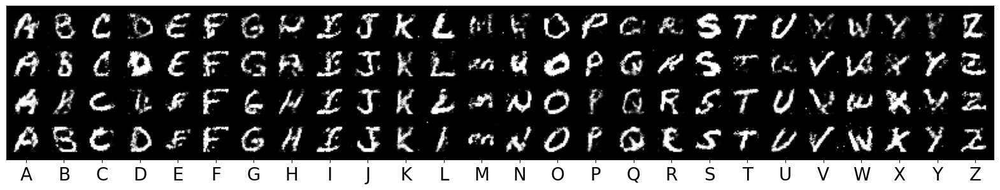

EPOCH:  5


100%|██████████| 3145/3145 [04:49<00:00, 10.87it/s]


Discriminator Loss: 0.6024861  Generator Loss: 1.0464335
SAVE MODEL --------------------------------------------------


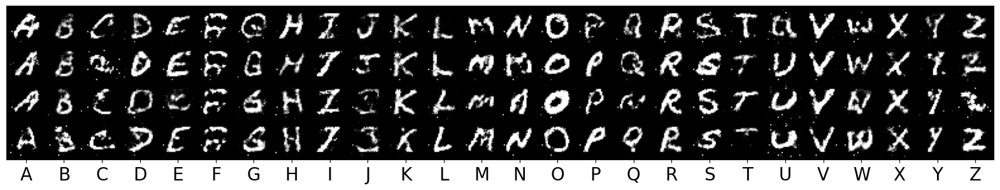

EPOCH:  6


100%|██████████| 3145/3145 [04:56<00:00, 10.62it/s]


Discriminator Loss: 0.6056544  Generator Loss: 1.0299958
SAVE MODEL --------------------------------------------------


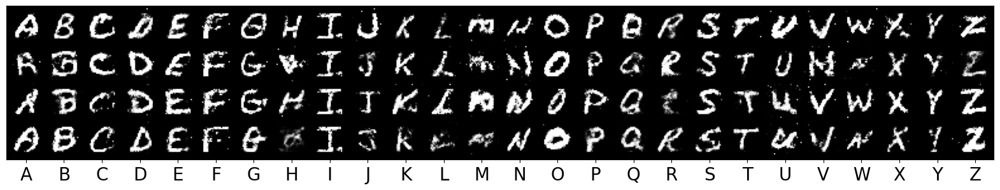

EPOCH:  7


100%|██████████| 3145/3145 [04:45<00:00, 11.00it/s]


Discriminator Loss: 0.6081679  Generator Loss: 1.0165680
SAVE MODEL --------------------------------------------------


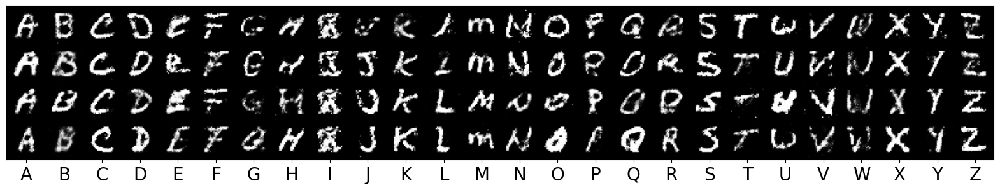

EPOCH:  8


100%|██████████| 3145/3145 [04:53<00:00, 10.72it/s]


Discriminator Loss: 0.6101143  Generator Loss: 1.0045329
SAVE MODEL --------------------------------------------------


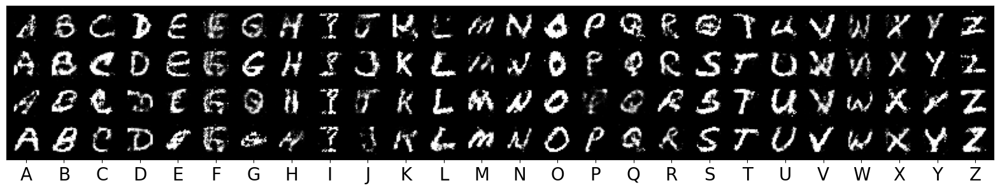

EPOCH:  9


100%|██████████| 3145/3145 [04:52<00:00, 10.76it/s]


Discriminator Loss: 0.6117873  Generator Loss: 0.9994747
SAVE MODEL --------------------------------------------------


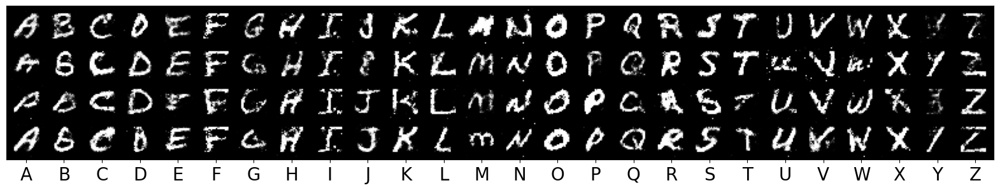

EPOCH:  10


100%|██████████| 3145/3145 [04:45<00:00, 11.02it/s]


Discriminator Loss: 0.6115769  Generator Loss: 1.0001302


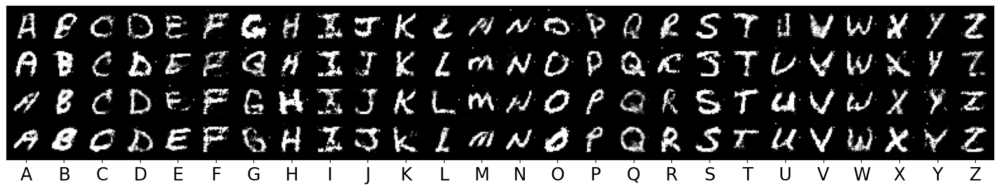

EPOCH:  11


100%|██████████| 3145/3145 [04:39<00:00, 11.24it/s]


Discriminator Loss: 0.6126601  Generator Loss: 0.9930072
SAVE MODEL --------------------------------------------------


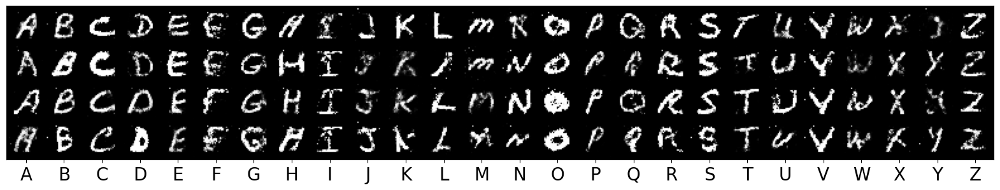

EPOCH:  12


100%|██████████| 3145/3145 [04:33<00:00, 11.49it/s]


Discriminator Loss: 0.6122663  Generator Loss: 0.9938246


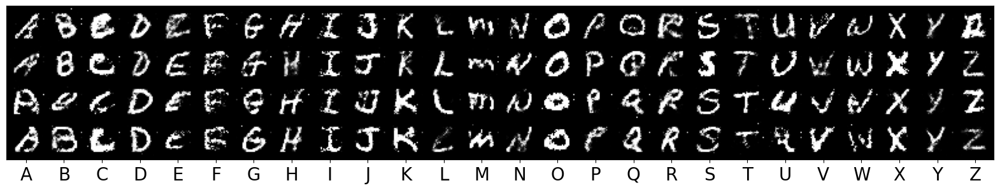

EPOCH:  13


100%|██████████| 3145/3145 [04:22<00:00, 11.97it/s]


Discriminator Loss: 0.6127413  Generator Loss: 0.9906986
SAVE MODEL --------------------------------------------------


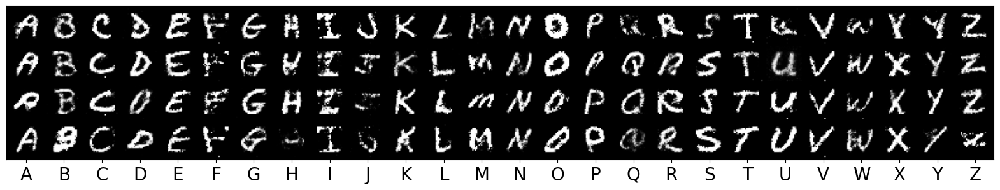

EPOCH:  14


100%|██████████| 3145/3145 [04:30<00:00, 11.63it/s]


Discriminator Loss: 0.6136216  Generator Loss: 0.9914377


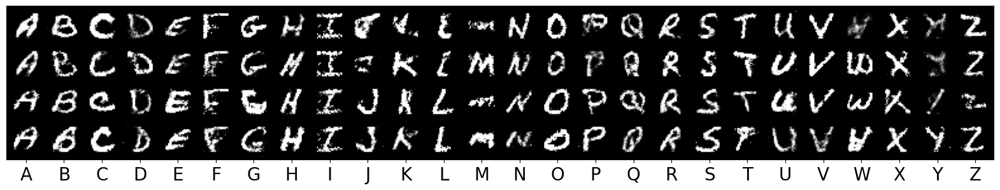

EPOCH:  15


100%|██████████| 3145/3145 [04:27<00:00, 11.76it/s]


Discriminator Loss: 0.6136328  Generator Loss: 0.9887302
SAVE MODEL --------------------------------------------------


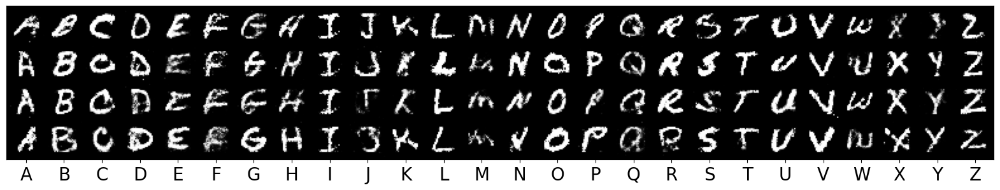

EPOCH:  16


100%|██████████| 3145/3145 [04:25<00:00, 11.86it/s]


Discriminator Loss: 0.6135783  Generator Loss: 0.9884605
SAVE MODEL --------------------------------------------------


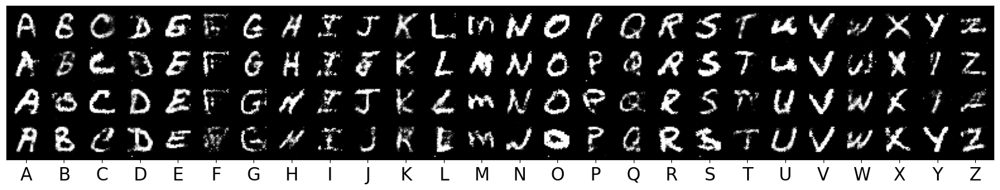

EPOCH:  17


100%|██████████| 3145/3145 [04:01<00:00, 13.02it/s]


Discriminator Loss: 0.6141114  Generator Loss: 0.9860325
SAVE MODEL --------------------------------------------------


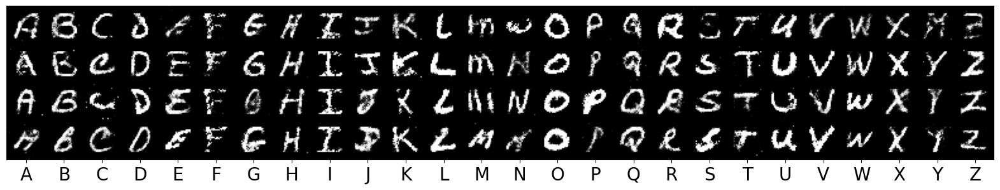

EPOCH:  18


100%|██████████| 3145/3145 [04:17<00:00, 12.22it/s]


Discriminator Loss: 0.6146691  Generator Loss: 0.9857042
SAVE MODEL --------------------------------------------------


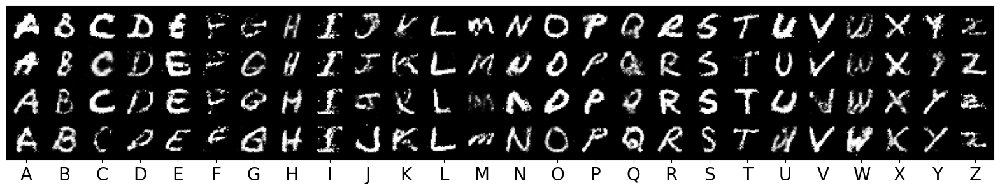

EPOCH:  19


100%|██████████| 3145/3145 [04:07<00:00, 12.71it/s]


Discriminator Loss: 0.6149840  Generator Loss: 0.9844528
SAVE MODEL --------------------------------------------------


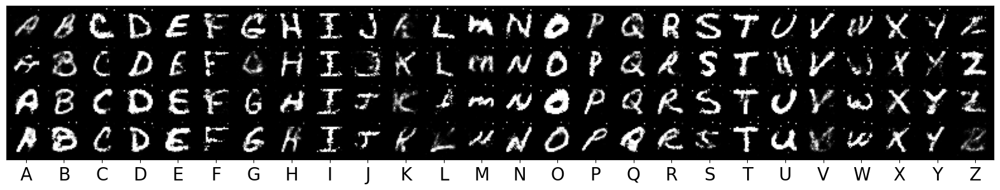

EPOCH:  20


100%|██████████| 3145/3145 [04:08<00:00, 12.65it/s]


Discriminator Loss: 0.6147388  Generator Loss: 0.9854468


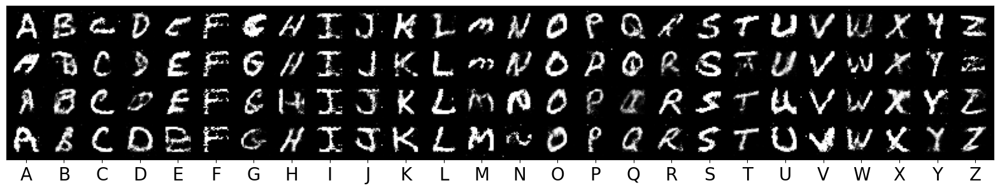

EPOCH:  21


100%|██████████| 3145/3145 [04:04<00:00, 12.86it/s]


Discriminator Loss: 0.6147031  Generator Loss: 0.9850462


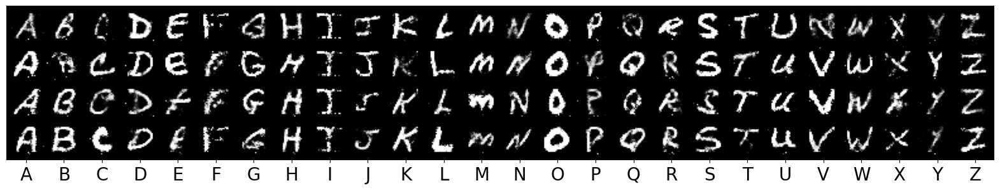

EPOCH:  22


100%|██████████| 3145/3145 [04:14<00:00, 12.37it/s]


Discriminator Loss: 0.6147791  Generator Loss: 0.9845258


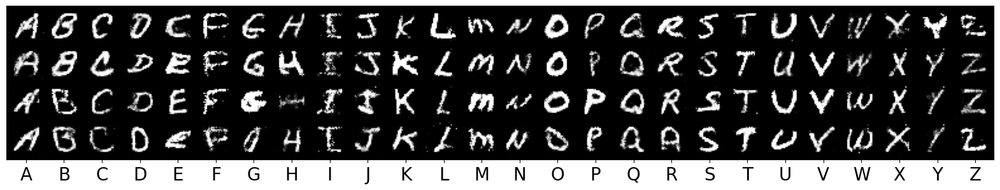

EPOCH:  23


100%|██████████| 3145/3145 [24:38<00:00,  2.13it/s]    


Discriminator Loss: 0.6148953  Generator Loss: 0.9831292
SAVE MODEL --------------------------------------------------


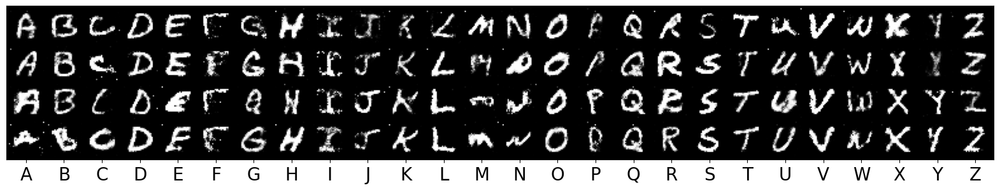

EPOCH:  24


100%|██████████| 3145/3145 [04:42<00:00, 11.12it/s]


Discriminator Loss: 0.6152689  Generator Loss: 0.9841575


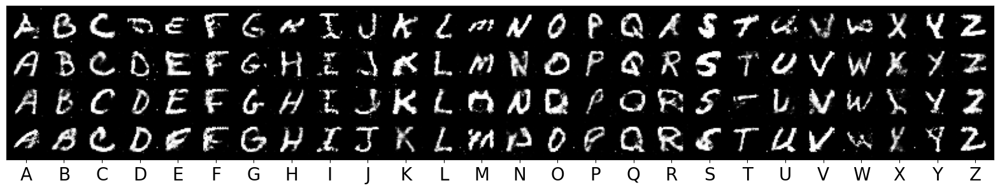

EPOCH:  25


100%|██████████| 3145/3145 [04:43<00:00, 11.10it/s]


Discriminator Loss: 0.6143207  Generator Loss: 0.9839033


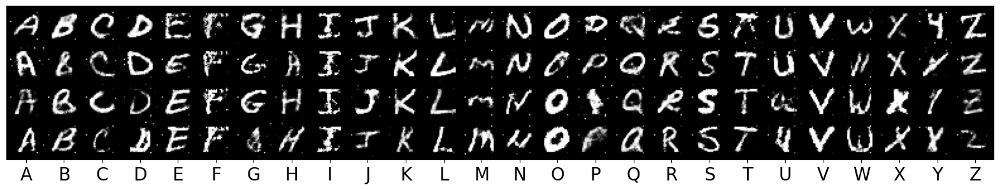

EPOCH:  26


100%|██████████| 3145/3145 [04:40<00:00, 11.23it/s]


Discriminator Loss: 0.6149360  Generator Loss: 0.9837757


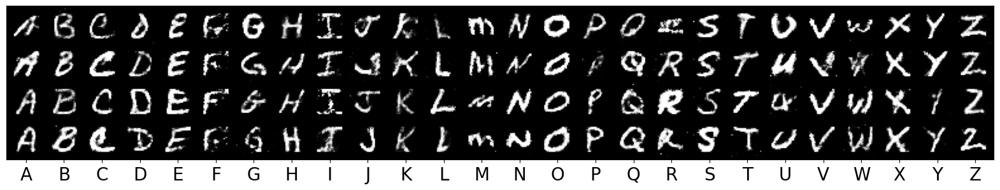

EPOCH:  27


100%|██████████| 3145/3145 [04:37<00:00, 11.34it/s]


Discriminator Loss: 0.6145228  Generator Loss: 0.9849853


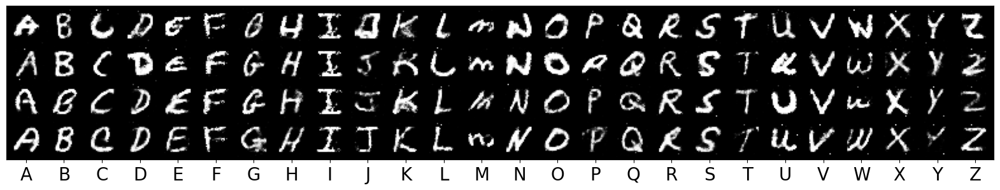

EPOCH:  28


100%|██████████| 3145/3145 [04:41<00:00, 11.18it/s]


Discriminator Loss: 0.6146114  Generator Loss: 0.9859141


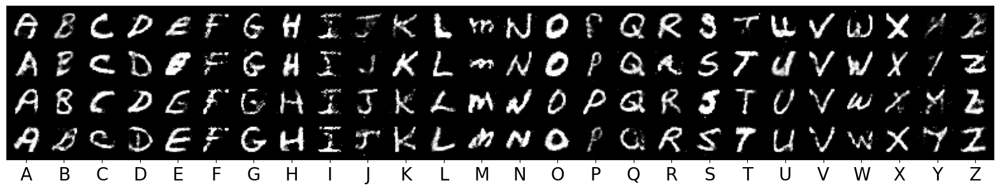

EPOCH:  29


100%|██████████| 3145/3145 [04:41<00:00, 11.18it/s]


Discriminator Loss: 0.6146030  Generator Loss: 0.9829501
SAVE MODEL --------------------------------------------------


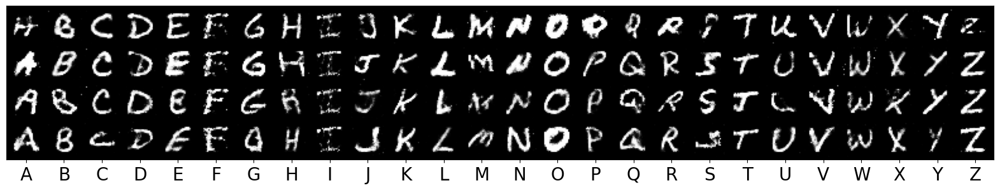

EPOCH:  30


100%|██████████| 3145/3145 [04:40<00:00, 11.20it/s]


Discriminator Loss: 0.6144077  Generator Loss: 0.9838425


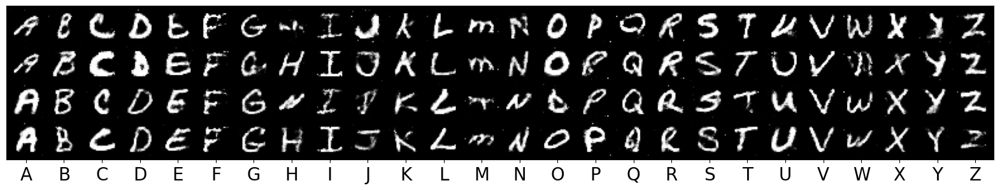

EPOCH:  31


100%|██████████| 3145/3145 [04:37<00:00, 11.33it/s]


Discriminator Loss: 0.6142269  Generator Loss: 0.9843833


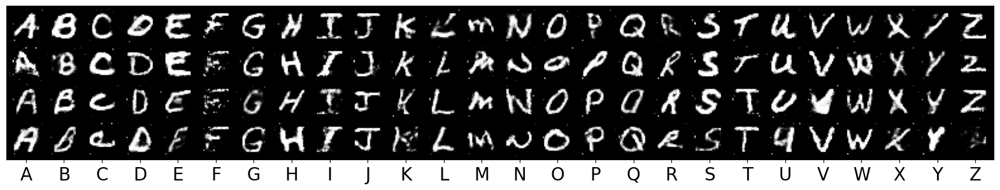

EPOCH:  32


100%|██████████| 3145/3145 [04:39<00:00, 11.24it/s]


Discriminator Loss: 0.6139596  Generator Loss: 0.9889809


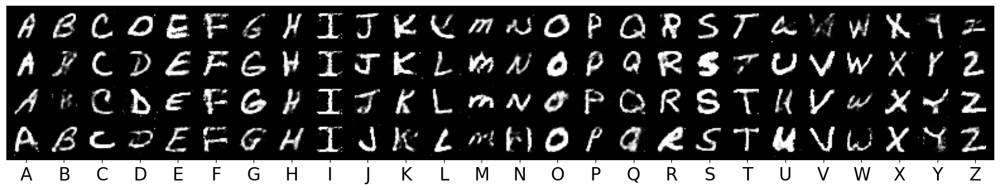

EPOCH:  33


100%|██████████| 3145/3145 [04:43<00:00, 11.09it/s]


Discriminator Loss: 0.6139080  Generator Loss: 0.9877664


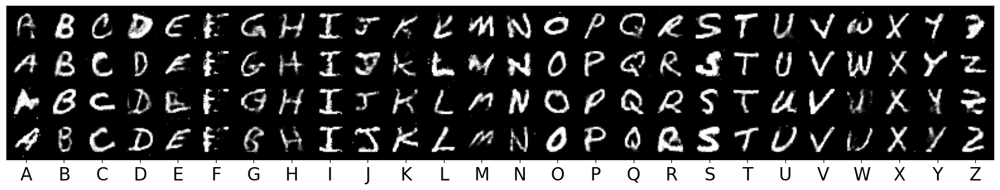

EPOCH:  34


100%|██████████| 3145/3145 [04:42<00:00, 11.15it/s]


Discriminator Loss: 0.6132089  Generator Loss: 0.9865258


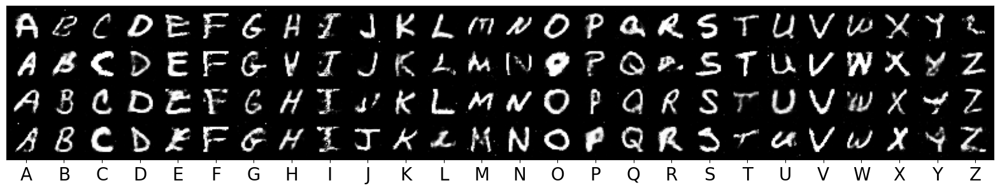

EPOCH:  35


100%|██████████| 3145/3145 [04:44<00:00, 11.07it/s]


Discriminator Loss: 0.6132987  Generator Loss: 0.9872390


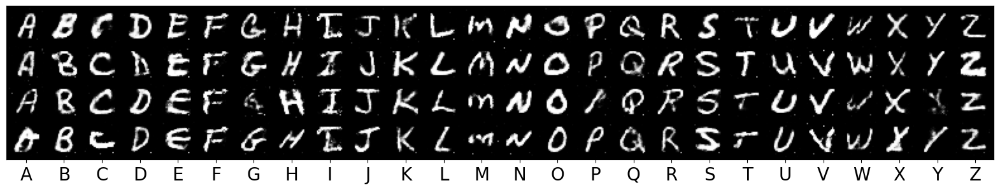

EPOCH:  36


100%|██████████| 3145/3145 [04:46<00:00, 10.99it/s]


Discriminator Loss: 0.6130904  Generator Loss: 0.9881422


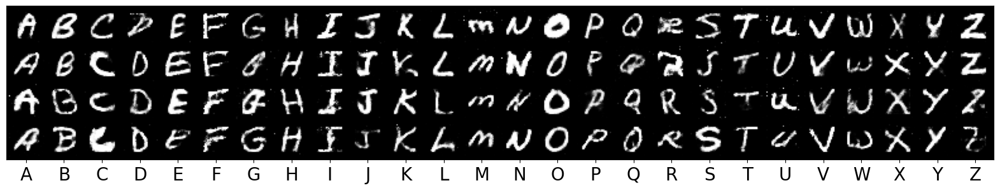

EPOCH:  37


100%|██████████| 3145/3145 [04:41<00:00, 11.18it/s]


Discriminator Loss: 0.6137248  Generator Loss: 0.9889823


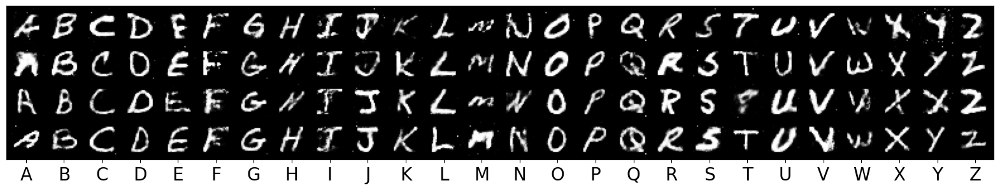

EPOCH:  38


100%|██████████| 3145/3145 [04:46<00:00, 10.98it/s]


Discriminator Loss: 0.6124659  Generator Loss: 0.9892189


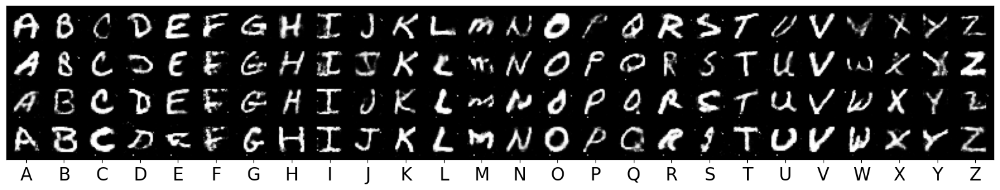

EPOCH:  39


100%|██████████| 3145/3145 [04:44<00:00, 11.06it/s]


Discriminator Loss: 0.6125402  Generator Loss: 0.9896132


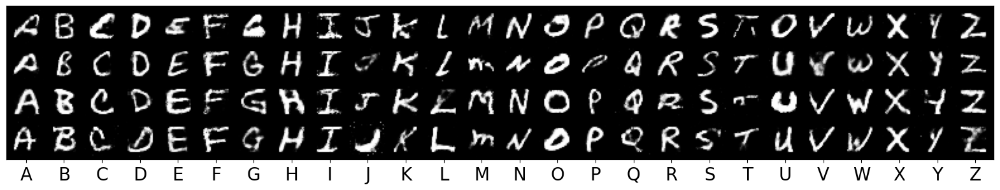

EPOCH:  40


100%|██████████| 3145/3145 [04:41<00:00, 11.19it/s]


Discriminator Loss: 0.6131497  Generator Loss: 0.9914175


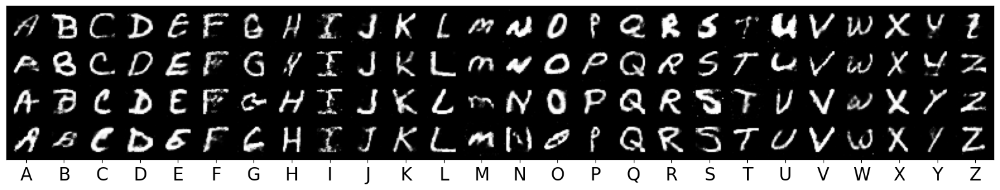

EPOCH:  41


100%|██████████| 3145/3145 [04:36<00:00, 11.39it/s]


Discriminator Loss: 0.6121600  Generator Loss: 0.9920252


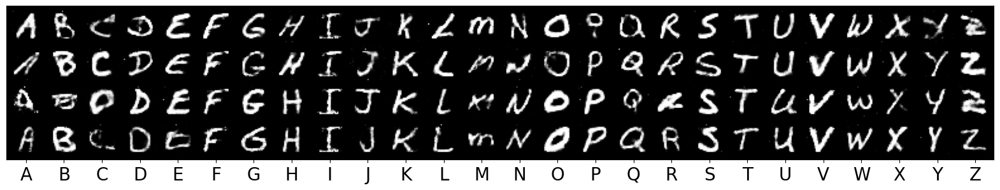

EPOCH:  42


100%|██████████| 3145/3145 [05:26<00:00,  9.62it/s]


Discriminator Loss: 0.6114909  Generator Loss: 0.9966062


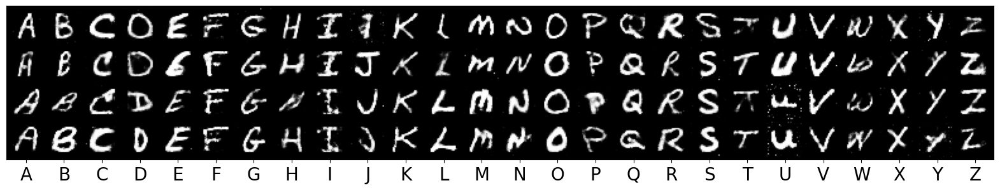

EPOCH:  43


100%|██████████| 3145/3145 [04:08<00:00, 12.65it/s]


Discriminator Loss: 0.6113815  Generator Loss: 0.9958134


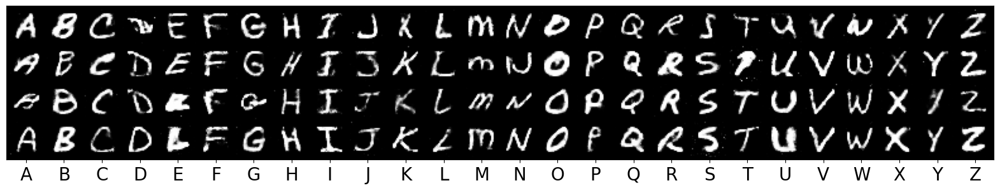

EPOCH:  44


100%|██████████| 3145/3145 [04:17<00:00, 12.20it/s]


Discriminator Loss: 0.6120188  Generator Loss: 0.9929951


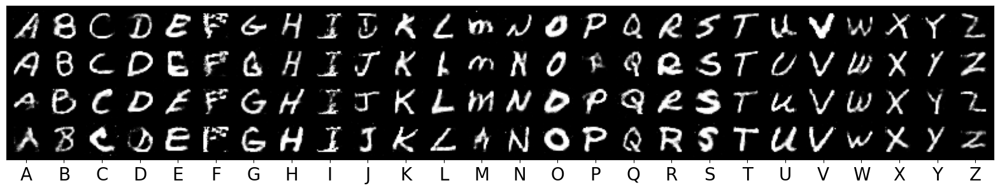

EPOCH:  45


100%|██████████| 3145/3145 [04:09<00:00, 12.63it/s]


Discriminator Loss: 0.6109966  Generator Loss: 0.9959511


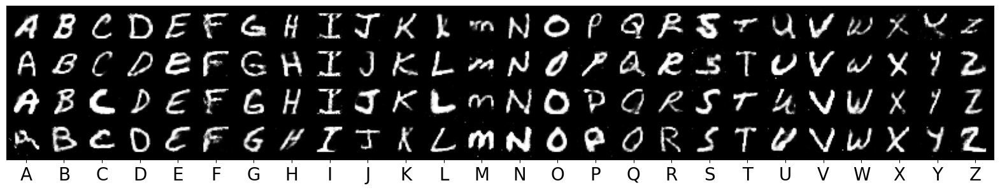

EPOCH:  46


100%|██████████| 3145/3145 [04:06<00:00, 12.77it/s]


Discriminator Loss: 0.6112237  Generator Loss: 0.9963224


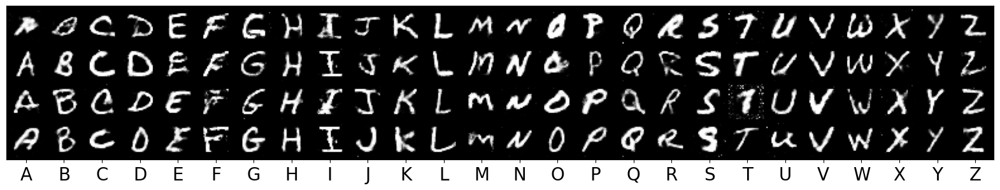

EPOCH:  47


100%|██████████| 3145/3145 [04:06<00:00, 12.75it/s]


Discriminator Loss: 0.6100966  Generator Loss: 0.9990336


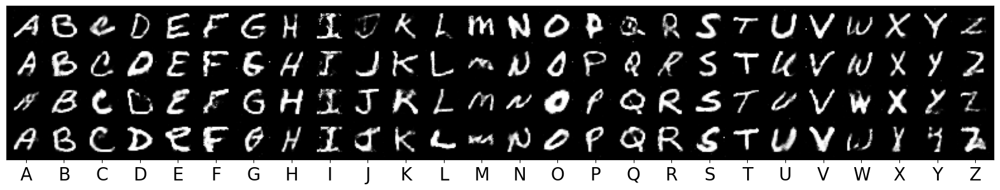

EPOCH:  48


100%|██████████| 3145/3145 [04:07<00:00, 12.72it/s]


Discriminator Loss: 0.6104746  Generator Loss: 0.9969348


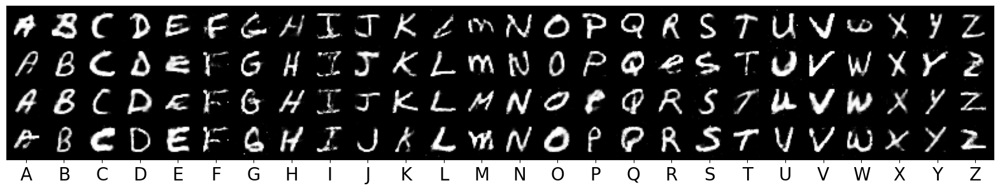

EPOCH:  49


100%|██████████| 3145/3145 [04:06<00:00, 12.76it/s]


Discriminator Loss: 0.6105152  Generator Loss: 0.9983786


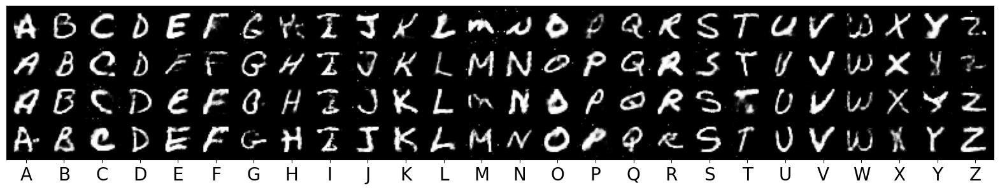

In [490]:
if __name__ == "__main__":

    print("START TRAINING")
    for epoch in range(epochs):
        # CAL_LOSS
        print("EPOCH: ",epoch)
        DISC_LOSS, GEN_LOSS = train(dataloader, GEN, gen_opt, DISC, disc_opt, num_label, z_dim)
        print(f"Discriminator Loss: {DISC_LOSS:.7f}  Generator Loss: {GEN_LOSS:.7f}")
        
        #SAVE MODEL
        if GEN_LOSS < good_value:
            good_value = GEN_LOSS
            checkpoint = {'epoch': epoch,
            'model_state_dict': GEN.state_dict(),
            'optimizer_state_dict': gen_opt.state_dict(),
            'best_loss': GEN_LOSS}
            torch.save(checkpoint, 'model.pth.tar')
            print("SAVE MODEL","-"*50)
        # SHOW RESULTS
        show(gen_noise, batch_size, z_dim, num_label, GEN)

## LOAD MODEL

In [10]:
checkpoint = torch.load("model.pth.tar")
GEN.load_state_dict(checkpoint["model_state_dict"])
gen_opt.load_state_dict(checkpoint["optimizer_state_dict"])
epoch = checkpoint["epoch"]
loss = checkpoint["best_loss"]

## TEST_SHOW_IMAGE

In [38]:
def test_image(input,batch_size,z_dim,num_label,GEN):
    noise = gen_noise(batch_size, z_dim)
    A_Z = list(string.ascii_uppercase)
    labels = torch.LongTensor([i for _ in range(batch_size // num_label) for i in range(num_label)]).to(device)
    sample_images = GEN(noise, labels).unsqueeze(1).data.cpu()
    labels_cpu = labels.cpu()
    # Show images
    print("YOU CHOSSE WORD: ",end =' ')
    choose_label = input
    List_label = A_Z * 3
    chosen_label = List_label[choose_label]
    print(chosen_label)
    chosen_image = sample_images[labels_cpu == choose_label][0].squeeze().numpy()
    _, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(chosen_image, cmap="gray")
    ax.set_title(chosen_label, fontsize=30)
    ax.axis("off")
    plt.show()

YOU CHOSSE WORD:  K


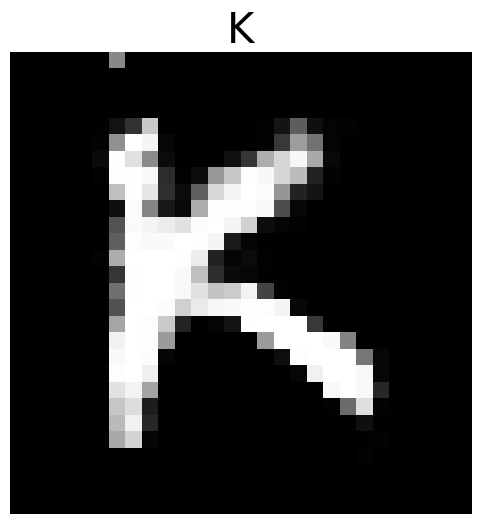

In [90]:
input = 10
test_image(input, batch_size, z_dim, num_label, GEN)